# Credit Card Approval Prediction

**Group 4:** Zhaohui (Emily) Fan, Amber Moon, Hansol Kim

### DATASET

Kaggle Datasource: https://www.kaggle.com/rikdifos/credit-card-approval-prediction

Other Context: https://mp.weixin.qq.com/s/upjzuPg5AMIDsGxlpqnoCg

### Business Context

Credit scores are a common risk control method in the financial industry. The credit card
data contains personal information and data submitted by credit card applicants that we can use
to predict whether the bank is able to issue a credit card to the applicant. There are two data files
used, the application data and the credit data which includes monthly credit card account status
information.

### Challenges Adressed in Analysis

**Primary business question:   Which features indicate a potentially risky candidate to extend credit to?**

For the purposes of this assignment, we will assume that a unique id equates to a unique persona to be included in modeling. Therefore, data shaping is based on unique ID's that appear in each dataset.

- **[Exploratory Analysis & Preprocessing](#eda-and-prep)**

- **[Visualization & Descriptive Analysis](#viz)**

- **[Feature Engineering & Final Preprocessing Steps (SMOTE)](#features)**

In [1]:
# import libraries and data
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd   
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
import itertools

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, plot_confusion_matrix, precision_score, recall_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier

In [2]:
applications_df = pd.read_csv('application_record.csv')
credit_df = pd.read_csv('credit_record.csv')

In [3]:
plt.rcParams['figure.facecolor'] = 'white'

<a id="eda-and-prep"></a>
### Exploratory Analysis & Preprocessing

In [4]:
# For Applications dataset: 
# View shape, nulls, cardinality, duplication (unique count of ID)
applications_df.shape

(438557, 18)

In [5]:
applications_df.isnull().sum()/applications_df.shape[0]

ID                     0.00000
CODE_GENDER            0.00000
FLAG_OWN_CAR           0.00000
FLAG_OWN_REALTY        0.00000
CNT_CHILDREN           0.00000
AMT_INCOME_TOTAL       0.00000
NAME_INCOME_TYPE       0.00000
NAME_EDUCATION_TYPE    0.00000
NAME_FAMILY_STATUS     0.00000
NAME_HOUSING_TYPE      0.00000
DAYS_BIRTH             0.00000
DAYS_EMPLOYED          0.00000
FLAG_MOBIL             0.00000
FLAG_WORK_PHONE        0.00000
FLAG_PHONE             0.00000
FLAG_EMAIL             0.00000
OCCUPATION_TYPE        0.30601
CNT_FAM_MEMBERS        0.00000
dtype: float64

In [6]:
# For Credit Records dataset: 
# View shape, nulls, cardinality, duplication (unique count of ID)
credit_df.shape

(1048575, 3)

In [7]:
credit_df.isnull().sum()

ID                0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [8]:
print("Unique ID's in credit records dataset:")
print(credit_df['ID'].nunique())
print('')
print("Unique ID's in applications dataset:")
print(applications_df['ID'].nunique())

Unique ID's in credit records dataset:
45985

Unique ID's in applications dataset:
438510


**Addressing Null Values**

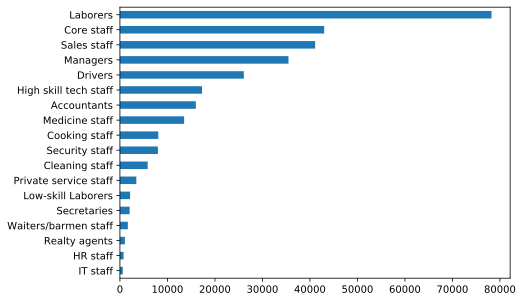

In [9]:
# 30% of Occupation Type column is null
applications_df['OCCUPATION_TYPE'].value_counts().sort_values().plot(kind='barh', figsize=(7,5))

**Because Occupation Type is a categorical variable, some possible options for addressing nulls are:**

1) Replace nulls with the mode

2) Ignore observations

3) Create a new category within variable

4) Predict the observation


**However,** since our dataset includes a comparable variable called Income Type, we will drop Occupation Type altogether. 

In [10]:
applications_df.drop('OCCUPATION_TYPE', axis=1, inplace=True)

We also see above that the Credit Records dataset has a long structure with 45,985 unique values in 1,048,575 rows, while the Applications dataset has minimal duplication.

**Therefore, to merge the two into one de-duplicated dataset with our target prediction variable we will:**

1) Identify how many IDs are common to both datasets (36,457)

2) Reshape Credit Records by Grouping by ID

3) Identify IDs where at any point in time there was a balance 60+ days overdue

In [11]:
len(set(applications_df['ID']).intersection(set(credit_df['ID'])))
id_index = list(set(applications_df['ID']).intersection(set(credit_df['ID'])))
applications_df = applications_df[applications_df['ID'].isin(id_index)]
print(applications_df.shape)

(36457, 17)


In [12]:
credit_df['dep_value'] = None
credit_df['dep_value'][credit_df['STATUS'] =='2']='Yes' 
credit_df['dep_value'][credit_df['STATUS'] =='3']='Yes' 
credit_df['dep_value'][credit_df['STATUS'] =='4']='Yes' 
credit_df['dep_value'][credit_df['STATUS'] =='5']='Yes' 

In [13]:
resp=credit_df.groupby('ID').count()
resp['dep_value'][resp['dep_value'] > 0]='Yes' 
resp['dep_value'][resp['dep_value'] == 0]='No' 
resp = resp[['dep_value']]

In [14]:
df=pd.merge(applications_df,resp,how='inner',on='ID')
df['target']=df['dep_value']
df.loc[df['target']=='Yes','target']=1
df.loc[df['target']=='No','target']=0
df.head().T

,0,1,2,3,4
ID,5008804,5008805,5008806,5008808,5008809
CODE_GENDER,M,M,M,F,F
FLAG_OWN_CAR,Y,Y,Y,N,N
FLAG_OWN_REALTY,Y,Y,Y,Y,Y
CNT_CHILDREN,0,0,0,0,0
AMT_INCOME_TOTAL,427500,427500,112500,270000,270000
NAME_INCOME_TYPE,Working,Working,Working,Commercial associate,Commercial associate
NAME_EDUCATION_TYPE,Higher education,Higher education,Secondary / secondary special,Secondary / secondary special,Secondary / secondary special
NAME_FAMILY_STATUS,Civil marriage,Civil marriage,Married,Single / not married,Single / not married
NAME_HOUSING_TYPE,Rented apartment,Rented apartment,House / apartment,House / apartment,House / apartment


In [15]:
#rename columns
df.rename(columns={'CODE_GENDER':'Gender','FLAG_OWN_CAR':'Car','FLAG_OWN_REALTY':'Reality','CNT_CHILDREN':'Children','AMT_INCOME_TOTAL':'income',
'NAME_EDUCATION_TYPE':'education','NAME_HOUSING_TYPE':'housing','FLAG_EMAIL':'email','NAME_INCOME_TYPE':'income_type','CNT_FAM_MEMBERS':'family_size',
},inplace=True)

<a id="viz"></a>
### Visualization & Descriptive Analysis

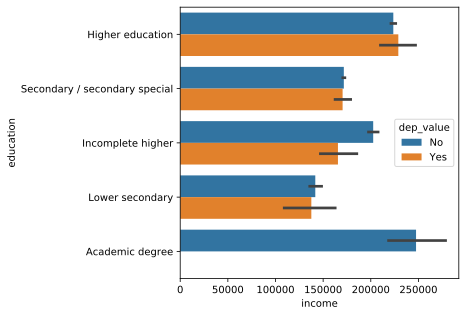

In [16]:
# How do income and education relate to credit status?
plt.figure(figsize=(5,5))
sns.barplot(x="income", y="education", hue="dep_value", data=df)

In [17]:
plt.figure(figsize=(5,5))
sns.stripplot(x="dep_value", y="income", data=df, jitter=True)

<Figure size 360x1080 with 0 Axes>

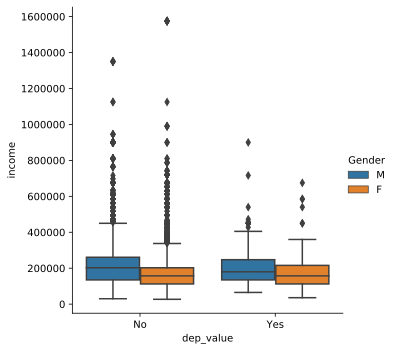

In [18]:
plt.figure(figsize=(5,15))
sns.catplot(x="dep_value", y="income", hue="Gender", kind="box", data=df)

In [19]:
# add column for age in years
df['age'] = df['DAYS_BIRTH']/-365
# add column for years in workforce
df['years_working'] = df['DAYS_EMPLOYED']/-365
# drop columns we aren't going to use
df = df.drop(columns={'ID', 'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'email', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'NAME_FAMILY_STATUS'})

In [20]:
# create subset risky_df to look for relationships within only "high risk"
# "high risk" = at any point in time had status 60 days or more overdue
risky = ['1']
risky_df = df.loc[df['target'].isin(risky)]

# Within risky subset, where can relationships be identified?
plt.figure(figsize=(3,3))
sns.pairplot(risky_df)

<Figure size 216x216 with 0 Axes>

<Figure size 720x720 with 0 Axes>

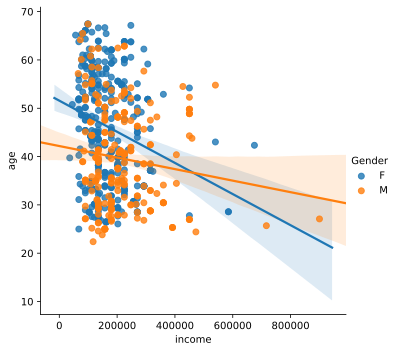

In [21]:
# Within risky subset, what are the relationships between income, age, gender and credit status?
plt.figure(figsize=(10, 10))
sns.lmplot(x="income", y="age", hue="Gender", data=risky_df)

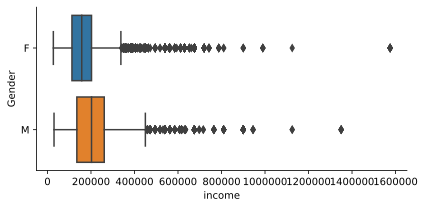

In [22]:
# Income by gender of applicants in dataset
sns.catplot(data=df.sort_values("income"), orient="h", kind="box", x="income", y="Gender", height=3, aspect=2)

<a id="features"></a>
### Feature Engineering

**Binary Data**

In [23]:
# replace M/F with 0/1
df['Gender'] = df['Gender'].replace(['F','M'],[1,0])
print(df['Gender'].value_counts())
# replace car flag with 0/1
df['Car'] = df['Car'].replace(['N','Y'],[0,1])
print(df['Car'].value_counts())
# replace realty with 0/1
df['Reality'] = df['Reality'].replace(['N','Y'],[0,1])
print(df['Reality'].value_counts())

1    24430
0    12027
Name: Gender, dtype: int64
0    22614
1    13843
Name: Car, dtype: int64
1    24506
0    11951
Name: Reality, dtype: int64


**Categorical Data**

In [24]:
# Convert continuous income to category
df['income'] = pd.cut(df['income'], bins=3, labels=["low", "medium", "high"])
# Convert continuous Children to category
df.loc[df['Children'] >= 2,'Children']='2orMore'
# Convert continuous Family Size to category
df.loc[df['family_size'] >= 3,'family_size']='3orMore'
# Convert continuous Age to category
df['age'] = pd.cut(df['age'], bins=3, labels=["young", "middle_age", "older"])
# Convert continuous Years Working to category
df['years_working'] = pd.cut(df['years_working'], bins=3, labels=["entry", "mid_career", "seasoned"])
df.head(2)

,Gender,Car,Reality,Children,income,income_type,education,housing,family_size,dep_value,target,age,years_working
0,0,1,1,0,low,Working,Higher education,Rented apartment,2,No,0,young,seasoned
1,0,1,1,0,low,Working,Higher education,Rented apartment,2,No,0,young,seasoned


**One Hot Encoding**

In [25]:
# convert all categories to binary
df = pd.get_dummies(df, columns=['income_type',
                                    'education',
                                    'housing',
                                      'income',
                                      'Children',
                                      'family_size',
                                      'age',
                                      'years_working'])
df.head(2)

,Gender,Car,Reality,dep_value,target,income_type_Commercial associate,income_type_Pensioner,income_type_State servant,income_type_Student,income_type_Working,...,Children_2orMore,family_size_1.0,family_size_2.0,family_size_3orMore,age_young,age_middle_age,age_older,years_working_entry,years_working_mid_career,years_working_seasoned
0,0,1,1,No,0,0,0,0,0,1,...,0,0,1,0,1,0,0,0,0,1
1,0,1,1,No,0,0,0,0,0,1,...,0,0,1,0,1,0,0,0,0,1


In [26]:
# rename columns
df = df.drop(columns={'dep_value'})
df.columns = ['Gender','Car','Reality','target','income_type_Commercial','income_type_Pensioner','income_type_State',
              'income_type_Student','income_type_Working','education_degree','education_Higher_ed',
              'education_Incomplete_higher','education_Lower_secondary','education_Secondary','housing_apartment',
              'housing_house','housing_municipal','housing_office_apartment','housing_rented_apartment','housing_parents',
              'income_low','income_medium','income_high','Children_0','Children_1','Children_2orMore','family_size_1',
              'family_size_2','family_size_3orMore','age_young','age_middle','age_older','years_working_entry',
              'years_working_mid_career','years_working_seasoned']

In [27]:
df['income_type_Commercial'] = df.income_type_Commercial.astype('int64')
df['income_type_Pensioner'] = df.income_type_Pensioner.astype('int64')
df['income_type_State'] = df.income_type_State.astype('int64')
df['income_type_Student'] = df.income_type_Student.astype('int64')
df['income_type_Working'] = df.income_type_Working.astype('int64')
df['education_degree'] = df.education_degree.astype('int64')
df['education_Higher_ed'] = df.education_Higher_ed.astype('int64')
df['education_Incomplete_higher'] = df.education_Incomplete_higher.astype('int64')
df['education_Lower_secondary'] = df.education_Lower_secondary.astype('int64')
df['education_Secondary'] = df.education_Secondary.astype('int64')
df['housing_apartment'] = df.housing_apartment.astype('int64')
df['housing_house'] = df.housing_house.astype('int64')
df['housing_municipal'] = df.housing_municipal.astype('int64')
df['housing_office_apartment'] = df.housing_office_apartment.astype('int64')
df['housing_rented_apartment'] = df.housing_rented_apartment.astype('int64')
df['housing_parents'] = df.housing_parents.astype('int64')
df['income_low'] = df.income_low.astype('int64')
df['income_medium'] = df.income_medium.astype('int64')
df['income_high'] = df.income_high.astype('int64')
df['Children_0'] = df.Children_0.astype('int64')
df['Children_1'] = df.Children_1.astype('int64')
df['Children_2orMore'] = df.Children_2orMore.astype('int64')
df['family_size_1'] = df.family_size_1.astype('int64')
df['family_size_2'] = df.family_size_2.astype('int64')
df['family_size_3orMore'] = df.family_size_3orMore.astype('int64')
df['age_young'] = df.age_young.astype('int64')
df['age_middle'] = df.age_middle.astype('int64')
df['age_older'] = df.age_older.astype('int64')
df['years_working_entry'] = df.years_working_entry.astype('int64')
df['years_working_mid_career'] = df.years_working_mid_career.astype('int64')
df['years_working_seasoned'] = df.years_working_seasoned.astype('int64')

### Split data and fix imbalance using SMOTE

In [28]:
# columns of data we will use to make classifications
X = df.drop('target', axis=1).copy()

# what we want to predict
y = df['target'].copy()

In [29]:
# Checking if the data is imbalanced or not
sum(y)/ len(y)
# 1.69% of the applicants are target users. We need to make sure we maintain the same % across training and testing datasets.
# It's called "stratification": split the data to maintain the ratio. 

0.016896617933455853

In [30]:
# Using Synthetic Minority Over-Sampling Technique(SMOTE) to overcome sample imbalance problem.
X_balance,Y_balance = SMOTE().fit_sample(X,y)
X_balance = pd.DataFrame(X_balance, columns = X.columns)

X_train, X_test, y_train, y_test = train_test_split(X_balance,Y_balance, 
                                                    stratify=Y_balance, test_size=0.3,
                                                    random_state = 1024)